# Bibliotecas, Leitura e Setup

## Bibliotecas

In [1]:
# Manipulação
import pandas as pd
import numpy as np

# Visualização
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf

# Feature Importance
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

# Redução de Dimensionalidade
from sklearn.inspection import permutation_importance
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

## Setup de Funções

In [2]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

In [3]:
def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

In [4]:
def min_max_normalize(df):
    return (df - df.min()) / (df.max() - df.min())

In [5]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'

C:\Users\Gustavo\AppData\Local\Temp\ipykernel_19776\4183850112.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


## Leitura

In [6]:
# Dados de entrada
df_entrada = pd.read_csv('DF_TEMPERATURA_CHAMA_TG_IASMIN(Entrada).csv')
df_entrada['TEMPO'] = pd.to_datetime(df_entrada['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_entrada.set_index('TEMPO', inplace=True)
df_entrada.columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7','TEMEPERATURA_ATM',
                      'TEMPERATURA_DO_GAS_COMBUSTIVEL','VAZAO_DE_GAS_COMBUSTIVEL',
                      'H2_CROMATOGRAFO','ANALISADOR_DE_H2',
                      'H2_NORM','CO_NORM','METANO_NORM','CO2_NORM','ETILENO_NORM','ETANO_NORM',
                      'PROPANO_NORM','PROPILENO_NORM','C5+_NORM','N-BUTANO_NORM','ENXOFRE_NORM',
                      'PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA',
                      'PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME',
                      'FATOR_DE_SOMA','PESO_MOLECULAR','DENSIDADE','DENSIDADE_RELATIVA',
                      'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
df_entrada['H2_NORM'] = df_entrada['H2_NORM'].shift(-5)
df_entrada['CO_NORM'] = df_entrada['CO_NORM'].shift(-5)
df_entrada['METANO_NORM'] = df_entrada['METANO_NORM'].shift(-5)
df_entrada['CO2_NORM'] = df_entrada['CO2_NORM'].shift(-5)
df_entrada['ETILENO_NORM'] = df_entrada['ETILENO_NORM'].shift(-5)
df_entrada['ETANO_NORM'] = df_entrada['ETANO_NORM'].shift(-5)
df_entrada['PROPANO_NORM'] = df_entrada['PROPANO_NORM'].shift(-5)
df_entrada['PROPILENO_NORM'] = df_entrada['PROPILENO_NORM'].shift(-5)
df_entrada['C5+_NORM'] = df_entrada['C5+_NORM'].shift(-5)
df_entrada['N-BUTANO_NORM'] = df_entrada['N-BUTANO_NORM'].shift(-5)
df_entrada['ENXOFRE_NORM'] = df_entrada['ENXOFRE_NORM'].shift(-5)
df_entrada = df_entrada.interpolate()

# Dados intermediários
df_intermediaria = pd.read_csv('DF_TEMPERATURA_CHAMA_TG_IASMIN(Intermediária).csv')
df_intermediaria = df_intermediaria.drop('COGER - GE1731 - SETPOINT BYPASS  AREA - CONTROLE EMISSAO (02MBM10DG901PV)', axis=1)
df_intermediaria['TEMPO'] = pd.to_datetime(df_intermediaria['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_intermediaria.set_index('TEMPO', inplace=True)
df_intermediaria.columns = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                            'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                            'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                            'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
df_intermediaria = df_intermediaria.interpolate()

# Dados de saída
df_saida = pd.read_csv('DF_TEMPERATURA_CHAMA_TG_IASMIN(Saída).csv')
df_saida['TEMPO'] = pd.to_datetime(df_saida['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_saida.set_index('TEMPO', inplace=True)
df_saida.columns = ['TEMPERATURA_MEDIA_DO_QUEIMADOR']
df_saida = df_saida.interpolate()

# Concatenação dos dataframes
df = pd.concat([df_entrada, df_intermediaria, df_saida], axis=1)
describe = df.describe().T
print('\n\033[93mHavia 7 linhas nulas, resolvidas com interpolação\033[0m')
df.info()


Havia 7 linhas nulas, resolvidas com interpolação
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10081 entries, 2024-07-15 00:00:00 to 2024-07-22 00:00:00
Data columns (total 49 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   POTENCIA_ATIVA_GERADOR              10081 non-null  float64
 1   TEMPERATURA_EXAUSTAO_T7             10081 non-null  float64
 2   TEMEPERATURA_ATM                    10081 non-null  float64
 3   TEMPERATURA_DO_GAS_COMBUSTIVEL      10081 non-null  float64
 4   VAZAO_DE_GAS_COMBUSTIVEL            10081 non-null  float64
 5   H2_CROMATOGRAFO                     10081 non-null  float64
 6   ANALISADOR_DE_H2                    10081 non-null  float64
 7   H2_NORM                             10081 non-null  float64
 8   CO_NORM                             10081 non-null  float64
 9   METANO_NORM                         10081 non-null  float64
 10  CO2_NORM            

In [7]:
df_5seg = pd.read_csv('DF_MORE_TEMP(Intermediário).csv')
df_5seg = df_5seg.drop('COGER - GE1731 - SETPOINT BYPASS  AREA - CONTROLE EMISSAO (02MBM10DG901PV)', axis=1)
df_5seg['TEMPO'] = pd.to_datetime(df_5seg['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_5seg.set_index('TEMPO', inplace=True)
df_5seg.columns = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
df_5seg = df_5seg.interpolate()
print('\n\033[93mHavia 153 linhas nulas, resolvidas com interpolação\033[0m')
df_5seg.info()


Havia 153 linhas nulas, resolvidas com interpolação
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 328321 entries, 2024-07-03 00:00:00 to 2024-07-22 00:00:00
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   QUEIMADOR_1           328321 non-null  float64
 1   QUEIMADOR_2           328321 non-null  float64
 2   QUEIMADOR_3           328321 non-null  float64
 3   QUEIMADOR_4           328321 non-null  float64
 4   QUEIMADOR_5           328321 non-null  float64
 5   QUEIMADOR_6           328321 non-null  float64
 6   QUEIMADOR_7           328321 non-null  float64
 7   QUEIMADOR_8           328321 non-null  float64
 8   QUEIMADOR_9           328321 non-null  float64
 9   QUEIMADOR_10          328321 non-null  float64
 10  QUEIMADOR_11          328321 non-null  float64
 11  QUEIMADOR_12          328321 non-null  float64
 12  QUEIMADOR_13          328321 non-null  float64
 13  QUEIMADOR_14     

# EDA - 1 min (15/07 - 22/07)

## Análise das Relações entre Features

### Potência das Chamas

Estas variáveis apresentam comportamento análogo com a variação da POTENCIA_ATIVA_GERADOR

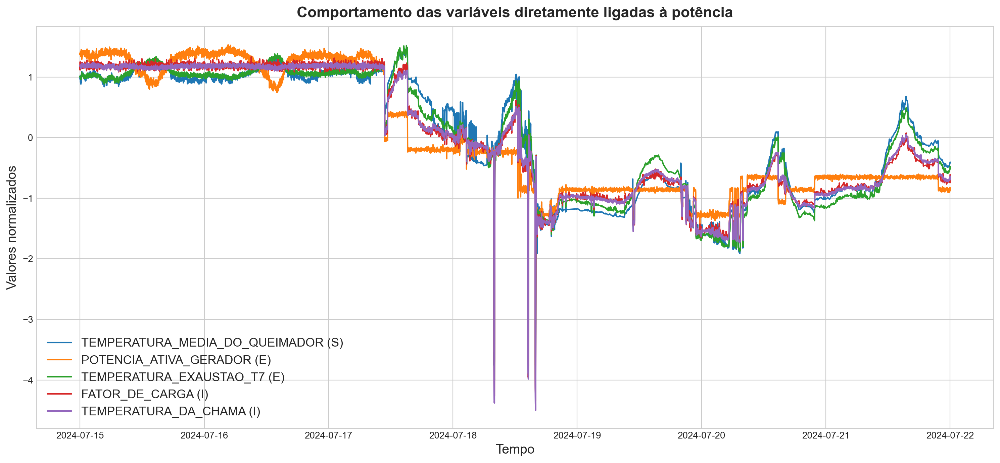

In [8]:
scaler = StandardScaler()
data_std = pd.DataFrame(scaler.fit_transform(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'].values.reshape(-1, 1)), columns=['TEMPERATURA_MEDIA_DO_QUEIMADOR (S)'])
data_std['POTENCIA_ATIVA_GERADOR (E)'] = scaler.fit_transform(df['POTENCIA_ATIVA_GERADOR'].values.reshape(-1, 1))
data_std['TEMPERATURA_EXAUSTAO_T7 (E)'] = scaler.fit_transform(df['TEMPERATURA_EXAUSTAO_T7'].values.reshape(-1, 1))
data_std['FATOR_DE_CARGA (I)'] = scaler.fit_transform(df['FATOR_DE_CARGA'].values.reshape(-1, 1))
data_std['TEMPERATURA_DA_CHAMA (I)'] = scaler.fit_transform(df['TEMPERATURA_DA_CHAMA'].values.reshape(-1, 1))
data_std.index = df.index

plt.figure(figsize=(15, 7))
for col in data_std.columns:
    plt.plot(data_std[col])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Valores normalizados', fontsize=14)
plt.title('Comportamento das variáveis diretamente ligadas à potência')
plt.legend(data_std.columns, fontsize=13)
plt.show()

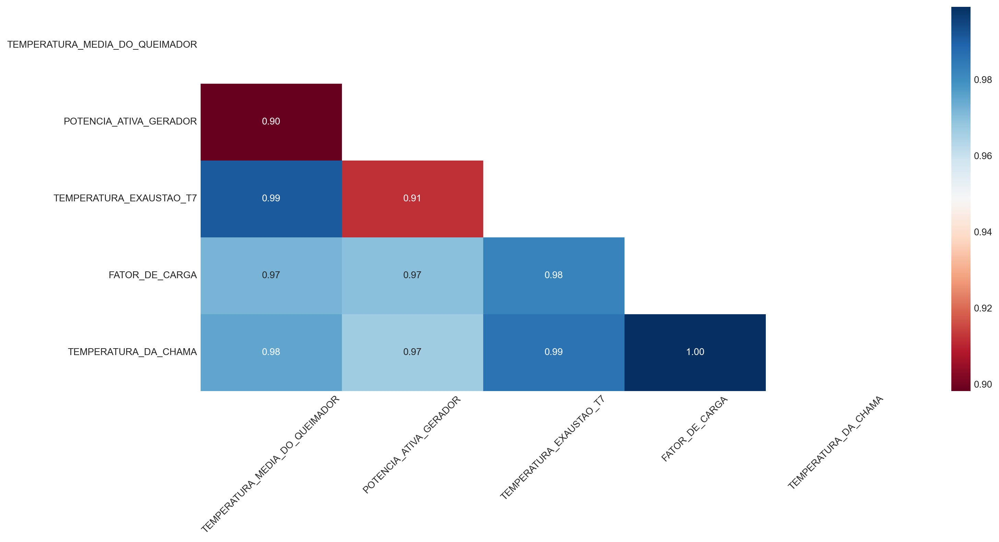

In [9]:
potencia_analogos = ['TEMPERATURA_MEDIA_DO_QUEIMADOR','POTENCIA_ATIVA_GERADOR',
                     'TEMPERATURA_EXAUSTAO_T7','FATOR_DE_CARGA','TEMPERATURA_DA_CHAMA']
sns.set_context(font_scale=1)
plt.figure(figsize=(16,8))
plt.grid()
sns.heatmap(
    df[potencia_analogos].corr(),
    annot=True,
    fmt='.2f',
    cmap='RdBu',
    mask=np.triu(np.ones_like(df[potencia_analogos].corr()))
    )
plt.xticks(rotation=45)
# plt.tick_params(axis='both', which='both', labelsize=14)
plt.show()

Dadas as anotações das paradas da turbinas, temos os seguintes tempos em que a máquina alcança seu valor **mínimo de potência**. Cerca de **7 minutos** para alcançar estes valores

In [10]:
smallest_indexes = df['POTENCIA_ATIVA_GERADOR'].nsmallest(27).index
peak = smallest_indexes[0:3]
smallest_indexes = sorted(smallest_indexes)

j = 0
print('\033[93m1ª parada começando às 07:52:00\033[0m')
for i in smallest_indexes:
    if j == 9:
        print('\n\033[93m2ª parada começando às 14:26:00\033[0m')
    elif j == 18:
        print('\n\033[93m3ª parada começando às 15:52:00\033[0m')
    j += 1
    if i in peak:
        print(f'\033[91m{i} {df.loc[i]["POTENCIA_ATIVA_GERADOR"]}\033[0m')
    print(f'{i} {df.loc[i]["POTENCIA_ATIVA_GERADOR"]}')

1ª parada começando às 07:52:00
2024-07-18 07:56:00 11.65921593
2024-07-18 07:57:00 10.04526901
2024-07-18 07:58:00 9.997731209
2024-07-18 07:59:00 9.905386925
2024-07-18 07:59:00 9.905386925
2024-07-18 08:00:00 10.01455975
2024-07-18 08:01:00 9.971236229
2024-07-18 08:02:00 10.13292789
2024-07-18 08:03:00 12.01910305
2024-07-18 08:04:00 14.37570095

2ª parada começando às 14:26:00
2024-07-18 14:29:00 10.30449104
2024-07-18 14:30:00 10.07755661
2024-07-18 14:31:00 9.978340149
2024-07-18 14:32:00 9.971345901
2024-07-18 14:33:00 9.967453957
2024-07-18 14:33:00 9.967453957
2024-07-18 14:34:00 10.09727001
2024-07-18 14:35:00 9.976363182
2024-07-18 14:36:00 11.98278046
2024-07-18 14:37:00 14.64300156

3ª parada começando às 15:52:00
2024-07-18 15:53:00 15.4423275
2024-07-18 15:54:00 10.22903061
2024-07-18 15:55:00 10.0144558
2024-07-18 15:56:00 10.04394245
2024-07-18 15:57:00 10.0359621
2024-07-18 15:58:00 9.995330811
2024-07-18 15:59:00 9.878825188
2024-07-18 15:59:00 9.878825188
2024-07-1

### Gases

A partir dos quartis, vemos que os principais gases que compõem a entrada são o H2 e Metano

In [11]:
gases = ['H2_NORM','CO_NORM','METANO_NORM','CO2_NORM','ETILENO_NORM','ETANO_NORM',
         'PROPANO_NORM','PROPILENO_NORM','C5+_NORM','N-BUTANO_NORM','ENXOFRE_NORM']
df[gases].describe()

,H2_NORM,CO_NORM,METANO_NORM,CO2_NORM,ETILENO_NORM,ETANO_NORM,PROPANO_NORM,PROPILENO_NORM,C5+_NORM,N-BUTANO_NORM,ENXOFRE_NORM
count,10081.000000,10081.000000,10081.000000,10081.000000,1.008100e+04,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000
mean,42.140672,0.242508,49.768793,0.778814,1.845323e-01,3.214310,1.060897,0.090452,0.088474,0.197633,0.002332
std,23.734543,0.264819,19.272272,1.035605,1.586207e-01,2.945951,1.401387,0.094370,0.102551,0.099163,0.000595
min,0.006765,0.000000,6.986838,0.000000,2.613010e-07,0.010258,0.014338,0.000000,0.000007,0.057519,0.000002
25%,26.186075,0.011012,36.654057,0.042318,3.271542e-03,0.300609,0.074533,0.003195,0.012521,0.126288,0.002050
50%,54.429924,0.031192,40.086246,0.151119,1.768845e-01,3.212738,0.184818,0.022852,0.025527,0.163438,0.002355
75%,58.128059,0.554159,64.684181,1.338236,1.988356e-01,4.815798,2.200162,0.201891,0.176813,0.291157,0.002769
max,92.304550,0.592652,85.023392,2.758352,4.959477e-01,8.276716,3.880166,0.216761,0.291860,0.433319,0.003595


Alguns gases seguem um comportamento semelhante a esses dois

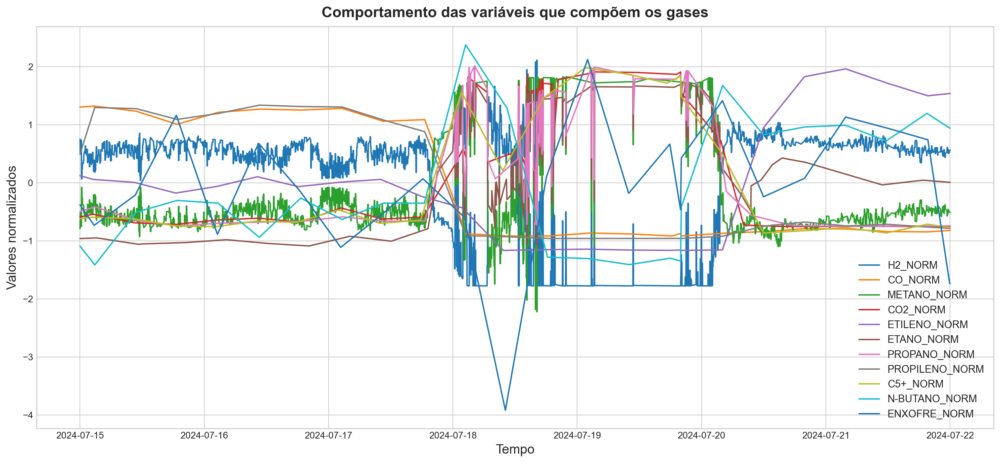

In [12]:
scaler = StandardScaler()
data_std = pd.DataFrame(scaler.fit_transform(df[gases].values), columns=gases)
data_std.index = df.index

plt.figure(figsize=(15, 7))
for col in data_std.columns:
    plt.plot(data_std[col])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Valores normalizados', fontsize=14)
plt.title('Comportamento das variáveis que compõem os gases')
plt.legend(data_std.columns, fontsize=11)
plt.show()

Em relação ao H2, Propileno e Etileno são os mais próximos em comportamento.  

Enquanto com o Metano são CO2, Etano, Propano e C5+.

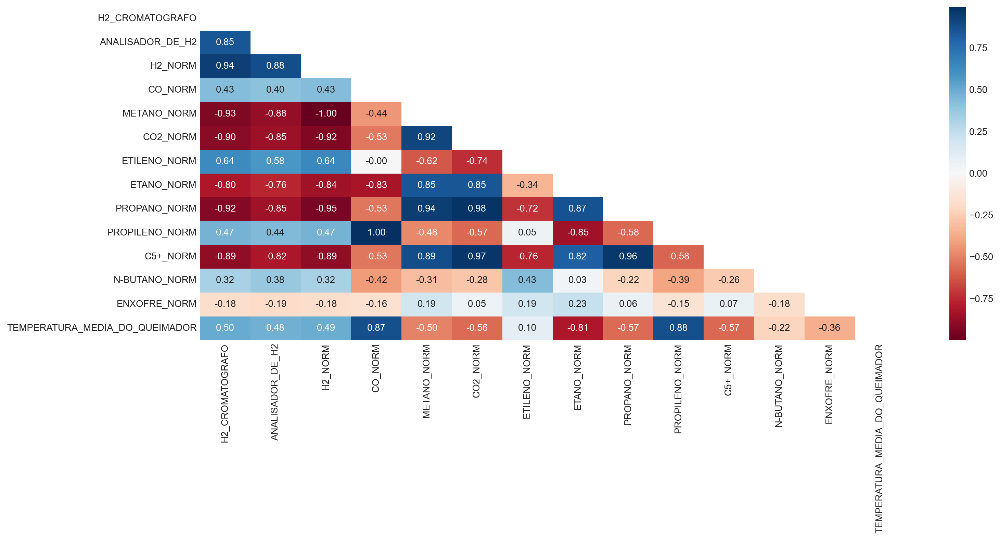

In [13]:
sns.set_context(font_scale=1)
plt.figure(figsize=(16,8))
plt.grid()
sns.heatmap(
    df.drop(df.columns[list(range(0,5)) + list(range(18,48))], axis=1).corr(),
    annot=True,
    fmt='.2f',
    cmap='RdBu',
    mask=np.triu(np.ones_like(df.drop(df.columns[list(range(0,5)) + list(range(18,48))], axis=1).corr()))
    )
plt.show()

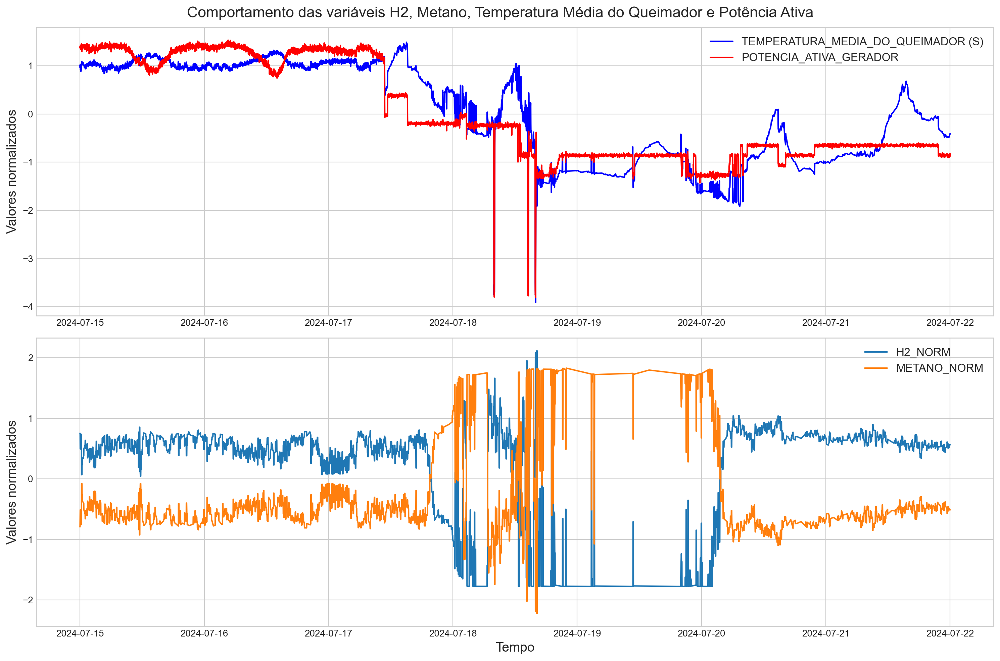

In [23]:
scaler = StandardScaler()
data_std = pd.DataFrame(scaler.fit_transform(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'].values.reshape(-1, 1)), columns=['TEMPERATURA_MEDIA_DO_QUEIMADOR (S)'])
data_std['POTENCIA_ATIVA_GERADOR'] = scaler.fit_transform(df['POTENCIA_ATIVA_GERADOR'].values.reshape(-1, 1))
data_std['H2_NORM'] = scaler.fit_transform(df['H2_NORM'].values.reshape(-1, 1))
data_std['METANO_NORM'] = scaler.fit_transform(df['METANO_NORM'].values.reshape(-1, 1))
data_std.index = df.index

fig, axs = plt.subplots(2, 1, figsize=(15, 10))
fig.suptitle('Comportamento das variáveis H2, Metano, Temperatura Média do Queimador e Potência Ativa', fontsize=16)

axs[0].plot(data_std.index, data_std.iloc[:, 0], label=data_std.columns[0], color='blue')
axs[0].plot(data_std.index, data_std.iloc[:, 1], label=data_std.columns[1], color='red')
axs[0].set_ylabel('Valores normalizados', fontsize=14)
axs[0].legend(fontsize=12)

axs[1].plot(data_std.index, data_std.iloc[:, 2], label=data_std.columns[2])
axs[1].plot(data_std.index, data_std.iloc[:, 3], label=data_std.columns[3])
axs[1].set_ylabel('Valores normalizados', fontsize=14)
axs[1].set_xlabel('Tempo', fontsize=14)
axs[1].legend(fontsize=12)

plt.tight_layout()
plt.show()

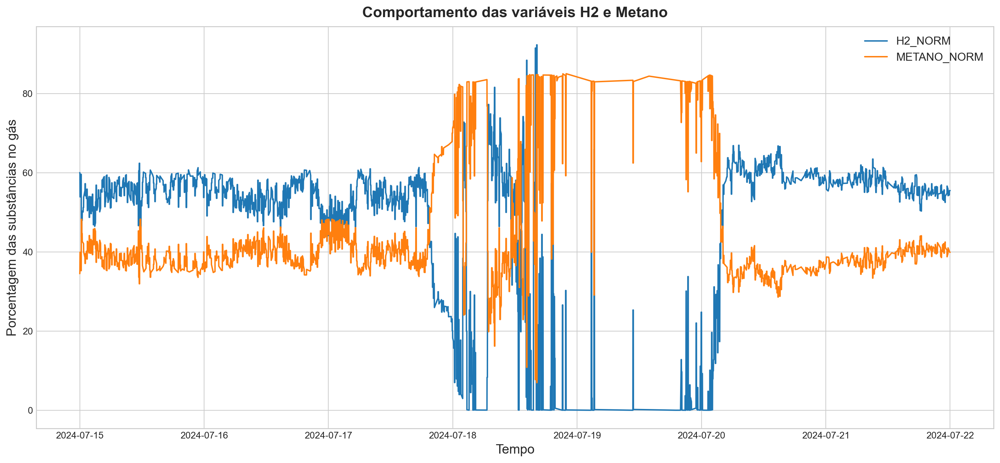

In [8]:
start_time = '2024-07-17 18:00:00'
end_time = '2024-07-20 06:00:00'

data_std = pd.DataFrame(df.loc[:]['H2_NORM'].values.reshape(-1, 1), columns=['H2_NORM'])
data_std['METANO_NORM'] = df.loc[:]['METANO_NORM'].values.reshape(-1, 1)
data_std.index = df.loc[:].index

plt.figure(figsize=(15, 7))
plt.plot(data_std.index, data_std['H2_NORM'], label=data_std.columns[0])
plt.plot(data_std.index, data_std['METANO_NORM'], label=data_std.columns[1])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Porcentagem das substâncias no gás', fontsize=14)
plt.title('Comportamento das variáveis H2 e Metano', fontsize=16)
plt.legend(fontsize=12)
plt.show()

In [8]:
def find_periods_above(series1, series2):
    periods = []
    start_time = None

    for time in series1.index:
        if series1[time] > series2[time]:
            if start_time is None:
                start_time = time
        else:
            if start_time is not None:
                end_time = time
                duration = end_time - start_time
                periods.append({'Start': start_time, 'End': end_time, 'Duration': duration})
                start_time = None

    # Handle case where the period extends to the end of the series
    if start_time is not None:
        end_time = series1.index[-1]
        duration = end_time - start_time
        periods.append({'Start': start_time, 'End': end_time, 'Duration': duration})

    return pd.DataFrame(periods)

start_time = '2024-07-17 18:00:00'
end_time = '2024-07-20 06:00:00'

series2 = df.loc[start_time:end_time]['METANO_NORM']
series1 = df.loc[start_time:end_time]['H2_NORM']

# procura os periodos onde o H2_NORM é maior que o METANO_NORM
periods_df = find_periods_above(series1, series2)

periods_df

,Start,End,Duration
0,2024-07-17 18:00:00,2024-07-17 19:33:00,0 days 01:33:00
1,2024-07-18 02:01:00,2024-07-18 02:38:00,0 days 00:37:00
2,2024-07-18 06:43:00,2024-07-18 11:14:00,0 days 04:31:00
3,2024-07-18 11:30:00,2024-07-18 11:35:00,0 days 00:05:00
4,2024-07-18 11:41:00,2024-07-18 12:13:00,0 days 00:32:00
5,2024-07-18 12:18:00,2024-07-18 12:23:00,0 days 00:05:00
6,2024-07-18 12:50:00,2024-07-18 12:55:00,0 days 00:05:00
7,2024-07-18 13:16:00,2024-07-18 13:59:00,0 days 00:43:00
8,2024-07-18 14:15:00,2024-07-18 14:20:00,0 days 00:05:00
9,2024-07-18 14:31:00,2024-07-18 14:41:00,0 days 00:10:00


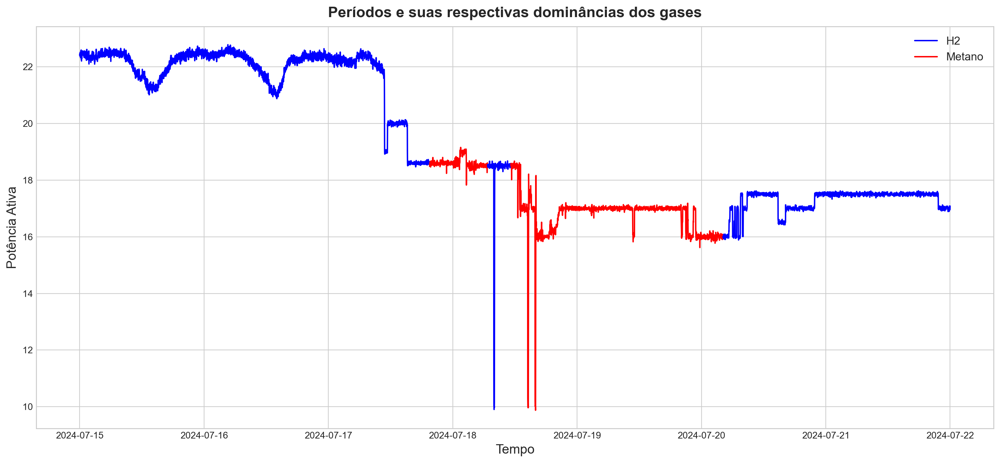

In [12]:
plt.figure(figsize=(15, 7))
plt.plot(df.loc[:'2024-07-17 19:33:00']['POTENCIA_ATIVA_GERADOR'] , label='H2', color='blue')
plt.plot(df.loc['2024-07-17 19:33:00':'2024-07-18 06:43:00']['POTENCIA_ATIVA_GERADOR'] , label='Metano', color='red')
plt.plot(df.loc['2024-07-18 06:43:00':'2024-07-18 11:14:00']['POTENCIA_ATIVA_GERADOR'] , color='blue')
plt.plot(df.loc['2024-07-18 11:14:00':'2024-07-20 04:10:00']['POTENCIA_ATIVA_GERADOR'] , color='red')
plt.plot(df.loc['2024-07-20 04:10:00':]['POTENCIA_ATIVA_GERADOR'] , color='blue')

plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Potência Ativa', fontsize=14)
plt.title('Períodos e suas respectivas dominâncias dos gases', fontsize=16)
plt.legend(fontsize=12)
plt.show()

### Queimadores

Nenhum comportamento tão fora do esperado entre os queimadores.  

Período entre os dias 19 e 20 apresenta distanciamento maior entre as temperaturas, indica instabilidade.

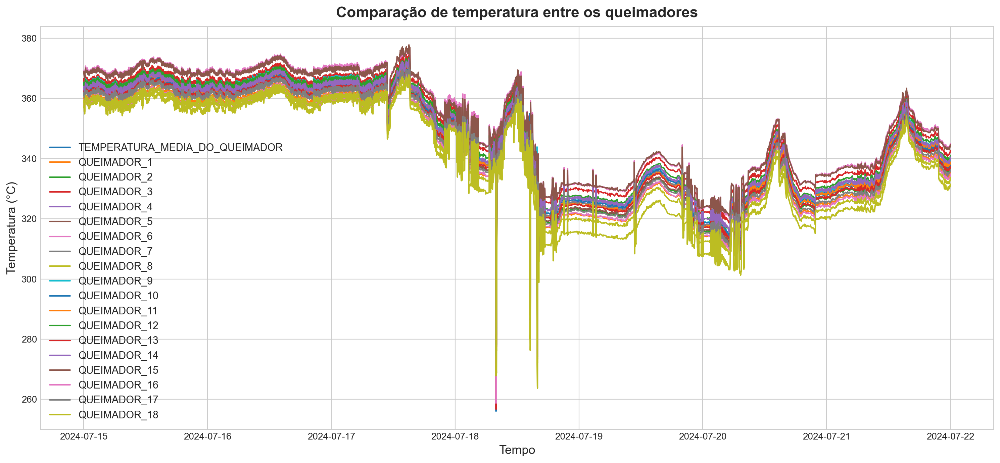

In [15]:
plt.figure(figsize=(15, 7))
plt.plot(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'])
for i in range(1, 19):
    plt.plot(df['QUEIMADOR_'+str(i)])
plt.legend(['TEMPERATURA_MEDIA_DO_QUEIMADOR'] + ['QUEIMADOR_'+str(i) for i in range(1, 19)], fontsize=11)
plt.title('Comparação de temperatura entre os queimadores')
plt.xlabel('Tempo', fontsize=13)
plt.ylabel('Temperatura (°C)', fontsize=13)
plt.show()

Diferença entre a média calculada manualmente e a fornecida

In [16]:
queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18']

manual_average = df[queimadores].mean(axis=1)
df_difference = abs(manual_average - df['TEMPERATURA_MEDIA_DO_QUEIMADOR'])
df_difference = df_difference.to_frame(name='DIFF_AVG_MANUAL_GIVEN')
df_difference.index = df_saida.index
for i in range(1, 19):
    df_difference['DIFF_Q'+str(i)+'_AVG_GIVEN'] = abs(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'] - df['QUEIMADOR_'+str(i)])

print('\033[93mQueimadores que registraram diferença com a média fornecida máxima maior que 15°C ao longo do tempo:\033[0m')
for i in range(1, 19):
    if df_difference['DIFF_Q'+str(i)+'_AVG_GIVEN'].max() > 15:
        print(f'QUEIMADOR_{i}', end='  ')

print('\n\n\033[93mDiferença entre a temperatura média do queimador e a média manual\033[0m')
df_difference.describe().T

Queimadores que registraram diferença com a média fornecida máxima maior que 15°C ao longo do tempo:
QUEIMADOR_2  QUEIMADOR_3  QUEIMADOR_8  QUEIMADOR_10  QUEIMADOR_12  QUEIMADOR_13  QUEIMADOR_16  QUEIMADOR_18  

Diferença entre a temperatura média do queimador e a média manual


,count,mean,std,min,25%,50%,75%,max
DIFF_AVG_MANUAL_GIVEN,10081.0,0.128913,0.166533,0.000010,0.051846,0.108521,0.175371,10.536311
DIFF_Q1_AVG_GIVEN,10081.0,3.236840,0.266632,1.541534,3.070007,3.237976,3.402832,9.551361
DIFF_Q2_AVG_GIVEN,10081.0,1.272489,0.456297,0.003388,1.017273,1.239410,1.513428,23.071899
DIFF_Q3_AVG_GIVEN,10081.0,3.902208,0.858142,0.342743,3.126678,3.930695,4.671326,20.421875
DIFF_Q4_AVG_GIVEN,10081.0,0.513593,0.305879,0.000122,0.320679,0.511627,0.678558,14.499420
DIFF_Q5_AVG_GIVEN,10081.0,0.761462,0.425835,0.000244,0.447693,0.732117,1.076782,8.620026
DIFF_Q6_AVG_GIVEN,10081.0,6.231876,0.509771,3.309113,5.853943,6.254120,6.627136,10.907806
DIFF_Q7_AVG_GIVEN,10081.0,0.369912,0.266823,0.000061,0.158539,0.374329,0.549713,12.925110
DIFF_Q8_AVG_GIVEN,10081.0,6.897979,1.807253,2.435242,5.340698,6.480316,8.403107,21.307098
DIFF_Q9_AVG_GIVEN,10081.0,1.594837,0.402584,0.126587,1.310364,1.589539,1.902252,13.536682


Em geral, a ocorrência dos maiores valores de diferença com a média acontecem por volta do momento das paradas

In [17]:
df_high = pd.DataFrame()
for i in range(1, 19):
    df_high['INDEX_Q'+str(i)+'_HIGH'] = df_difference['DIFF_Q'+str(i)+'_AVG_GIVEN'].nlargest(7).index
    df_high['DIFF_Q'+str(i)+'_HIGH'] = df_difference['DIFF_Q'+str(i)+'_AVG_GIVEN'].nlargest(7).values
print('\033[91mNo dia 18:\033[0m')
print('\033[93m1ª parada começando às 07:52:00\033[0m')
print('\033[93m2ª parada começando às 14:26:00\033[0m')
print('\033[93m3ª parada começando às 15:52:00\033[0m')
df_high.T

No dia 18:
1ª parada começando às 07:52:00
2ª parada começando às 14:26:00
3ª parada começando às 15:52:00


,0,1,2,3,4,5,6
INDEX_Q1_HIGH,2024-07-18 15:53:00,2024-07-18 07:56:00,2024-07-18 03:37:00,2024-07-18 14:19:00,2024-07-17 22:26:00,2024-07-18 01:10:00,2024-07-18 02:39:00
DIFF_Q1_HIGH,9.551361,9.247467,4.759644,4.564758,4.407745,4.362183,4.34137
INDEX_Q2_HIGH,2024-07-18 15:53:00,2024-07-18 07:56:00,2024-07-18 14:40:00,2024-07-18 14:19:00,2024-07-17 22:26:00,2024-07-19 21:05:00,2024-07-18 14:09:00
DIFF_Q2_HIGH,23.071899,16.184906,3.981903,3.928314,3.473053,3.438934,3.396942
INDEX_Q3_HIGH,2024-07-18 07:56:00,2024-07-18 08:05:00,2024-07-18 14:37:00,2024-07-18 14:38:00,2024-07-18 08:04:00,2024-07-18 15:58:00,2024-07-18 16:02:00
DIFF_Q3_HIGH,20.421875,7.430695,7.147614,7.07486,6.950165,6.928101,6.841797
INDEX_Q4_HIGH,2024-07-18 15:53:00,2024-07-18 16:02:00,2024-07-18 08:05:00,2024-07-18 14:38:00,2024-07-18 14:19:00,2024-07-18 08:04:00,2024-07-18 16:00:00
DIFF_Q4_HIGH,14.49942,4.701294,4.268036,3.394165,2.619629,2.576721,2.547791
INDEX_Q5_HIGH,2024-07-18 07:56:00,2024-07-18 15:53:00,2024-07-18 15:58:00,2024-07-18 15:57:00,2024-07-18 15:56:00,2024-07-18 15:54:00,2024-07-18 15:55:00
DIFF_Q5_HIGH,8.620026,8.343201,2.636658,2.603302,2.569977,2.549072,2.546417


Diferença entre o queimador com menor e maior temperatura a cada instante.  

Os picos de diferença refletem as paradas da máquina.

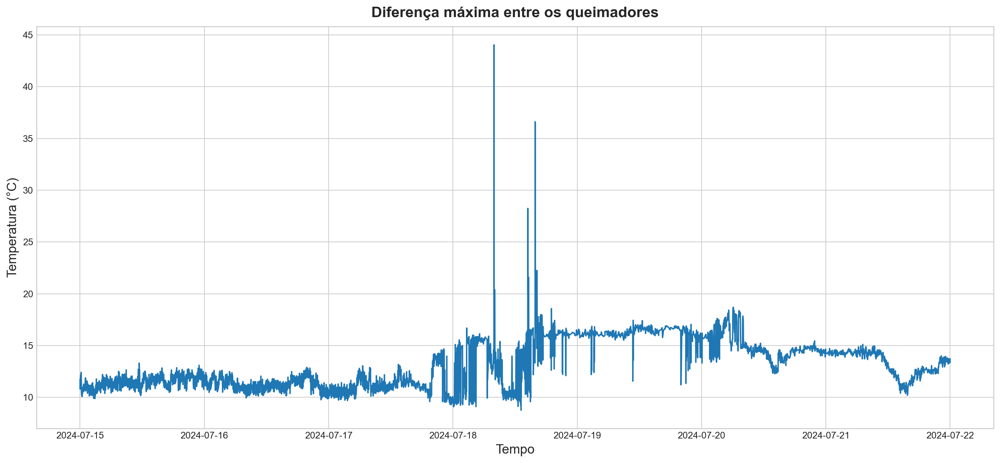

In [18]:
min_values = df[queimadores].min(axis=1)
max_values = df[queimadores].max(axis=1)
diff = max_values - min_values

# plot 
plt.figure(figsize=(15, 7))
plt.plot(diff, label='Diferença')
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Temperatura (°C)', fontsize=14)
plt.title('Diferença máxima entre os queimadores')
plt.show()


### Propriedades do Gás

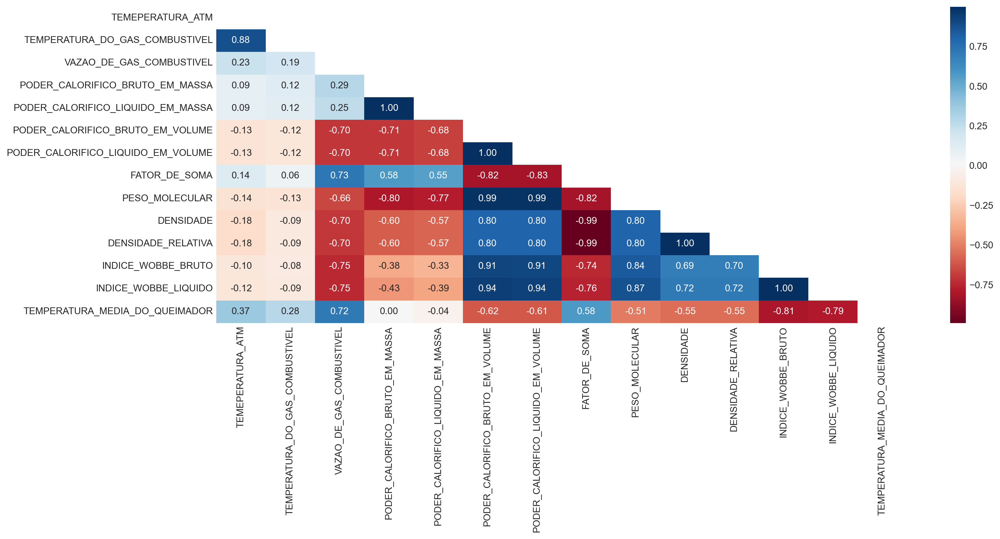

In [19]:
propriedades = ['TEMEPERATURA_ATM','TEMPERATURA_DO_GAS_COMBUSTIVEL','VAZAO_DE_GAS_COMBUSTIVEL',
                'PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA',
                'PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME',
                'FATOR_DE_SOMA','PESO_MOLECULAR','DENSIDADE','DENSIDADE_RELATIVA',
                'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']

sns.set_context(font_scale=1)
plt.figure(figsize=(16,8))
plt.grid()
sns.heatmap(
    df[propriedades].corr(),
    annot=True,
    fmt='.2f',
    cmap='RdBu',
    mask=np.triu(np.ones_like(df[propriedades].corr()))
    )
plt.show()

O comportamento das propriedades segue os da composição do gás quanto ao H2 e Metano

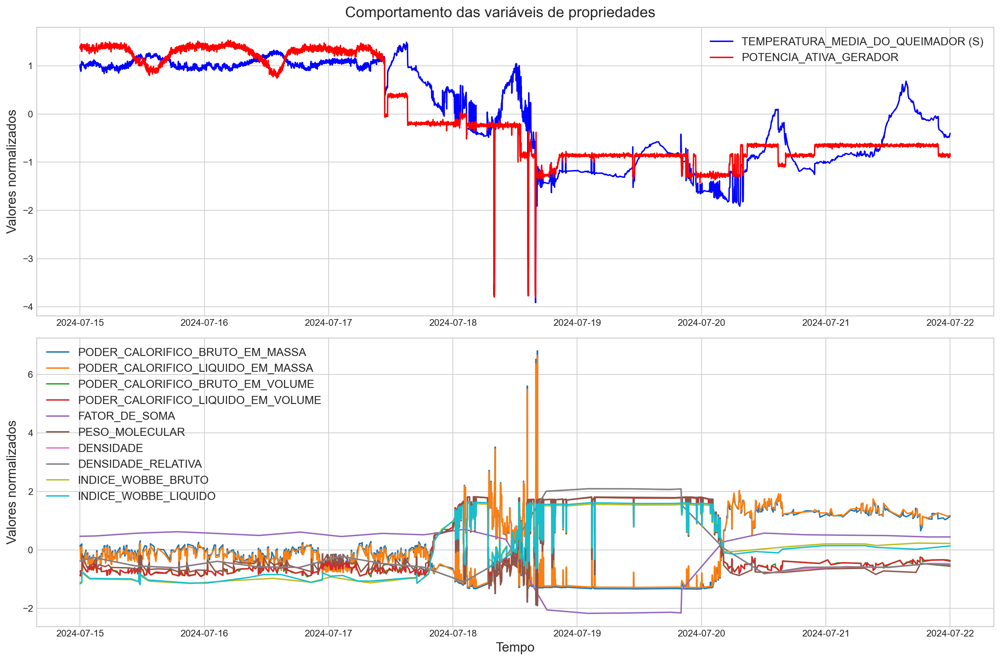

In [20]:
propriedades2 = ['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA',
                'PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME',
                'FATOR_DE_SOMA','PESO_MOLECULAR','DENSIDADE','DENSIDADE_RELATIVA',
                'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO','VAZAO_DE_GAS_COMBUSTIVEL']

scaler = StandardScaler()
data_std = pd.DataFrame(scaler.fit_transform(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'].values.reshape(-1, 1)), columns=['TEMPERATURA_MEDIA_DO_QUEIMADOR (S)'])
data_std['POTENCIA_ATIVA_GERADOR'] = scaler.fit_transform(df['POTENCIA_ATIVA_GERADOR'].values.reshape(-1, 1))
data_std.index = df.index
for col in propriedades2:
    data_std[col] = scaler.fit_transform(df[col].values.reshape(-1, 1))


fig, axs = plt.subplots(2, 1, figsize=(15, 10))
fig.suptitle('Comportamento das variáveis de propriedades', fontsize=16)

axs[0].plot(data_std.index, data_std.iloc[:, 0], label=data_std.columns[0], color='blue')
axs[0].plot(data_std.index, data_std.iloc[:, 1], label=data_std.columns[1], color='red')
axs[0].set_ylabel('Valores normalizados', fontsize=14)
axs[0].legend(fontsize=12)

for i in range(2, 12):
    axs[1].plot(data_std.index, data_std.iloc[:, i], label=data_std.columns[i])
axs[1].set_ylabel('Valores normalizados', fontsize=14)
axs[1].set_xlabel('Tempo', fontsize=14)
axs[1].legend(fontsize=12)

plt.tight_layout()
plt.show()

## Feature Importance

Vamos analisar a importância das demais features para aquela que é mais importante no dataset, POTENCIA_ATIVA_GERADOR.

Vamos considerar 2 situações, o comportamento levando em conta apenas a parte estável (quando os níveis de H2 são maiores que de Metano) e o dataset inteiro.

Normalização dos dados

In [21]:
period_1 = '2024-07-17 18:00:00'
period_2 = '2024-07-20 06:00:00'

df_all = df.apply(min_max_normalize)
df_stable = pd.concat([df_all.loc[:period_1], df_all.loc[period_2:]])

Treinamento com Regressão Linear tentando prever o comportamento da potência de acordo com as demais, plot dos pesos

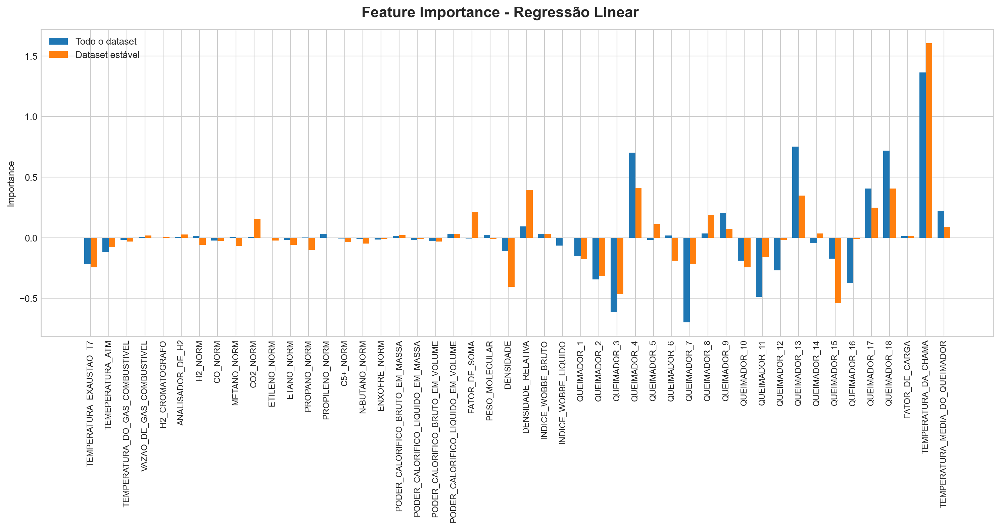

In [22]:
fig, ax = plt.subplots(figsize=(15, 8))
fig.suptitle('Feature Importance - Regressão Linear', fontsize=16, fontweight='bold')
ax.set_ylabel('Importance')
ax.grid(True)
bar_width = 0.35
index = np.arange(len(df.columns)-1)
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(df_all.columns.drop('POTENCIA_ATIVA_GERADOR'), rotation=90, fontsize=9)
plt.tight_layout(rect=[0, 0, 1, 0.96])

X = df_all.drop('POTENCIA_ATIVA_GERADOR', axis=1)
y = df_all['POTENCIA_ATIVA_GERADOR']
model = LinearRegression()
model.fit(X, y)
importance = model.coef_
ax.bar(index, importance, bar_width, label='Todo o dataset')

X = df_stable.drop('POTENCIA_ATIVA_GERADOR', axis=1)
y = df_stable['POTENCIA_ATIVA_GERADOR']
model = LinearRegression()
model.fit(X, y)
importance = model.coef_
ax.bar(index + bar_width, importance, bar_width, label='Dataset estável')

ax.legend()
plt.show()

## Análise da Série Temporal

A potência ativa atual possui uma dependência linear do valores de até 3 minutos atrás

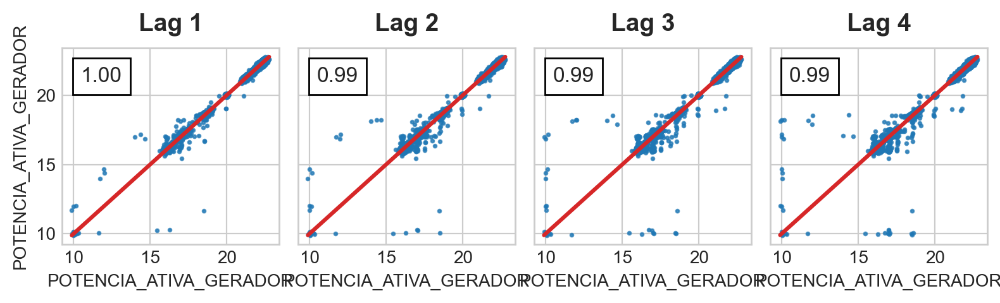

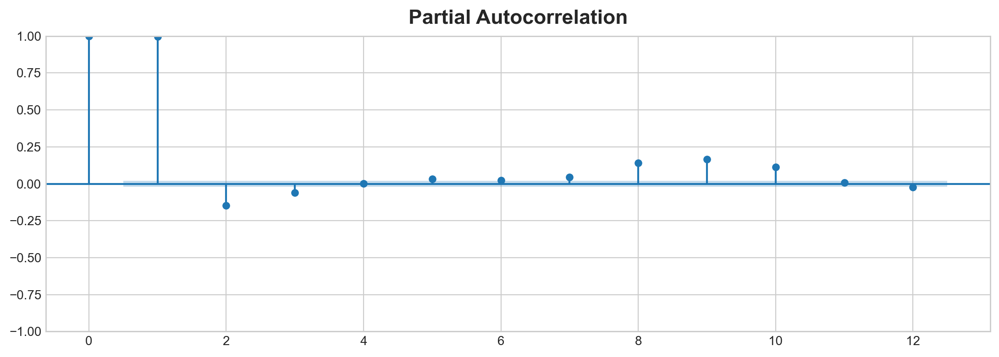

In [23]:
_ = plot_lags(df['POTENCIA_ATIVA_GERADOR'], lags=4, nrows=1)
_ = plot_pacf(df['POTENCIA_ATIVA_GERADOR'], lags=12)

# EDA - 5 seg (03/07 - 21/07)

In [24]:
df_5seg.describe().T

,count,mean,std,min,25%,50%,75%,max
QUEIMADOR_1,328321.0,343.150880,15.273156,262.682007,328.169159,346.347382,357.581055,370.094421
QUEIMADOR_2,328321.0,345.124991,15.442548,252.081573,329.966675,348.286804,359.741760,372.592071
QUEIMADOR_3,328321.0,350.246858,14.635274,283.506470,336.136139,353.199829,364.298492,376.759369
QUEIMADOR_4,328321.0,346.673542,15.241580,275.830414,331.835449,349.881409,361.035919,372.768250
QUEIMADOR_5,328321.0,345.511943,15.503197,264.042023,330.300049,348.976715,360.010101,371.676208
QUEIMADOR_6,328321.0,352.497401,14.900617,284.419128,338.063568,355.807861,366.675873,378.172150
QUEIMADOR_7,328321.0,346.661531,15.088640,259.237457,331.878235,350.079834,360.961822,372.097595
QUEIMADOR_8,328321.0,339.425689,16.731716,263.702667,323.119171,343.043793,355.038757,366.791107
QUEIMADOR_9,328321.0,347.863356,15.459686,266.938538,332.700012,351.024048,362.495636,374.093720
QUEIMADOR_10,328321.0,346.363400,14.640315,239.386490,332.200012,349.581238,360.345642,376.335449


O comportamento do período antes do dia 15 difere bastante do seu estado posterior

C:\Users\Gustavo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


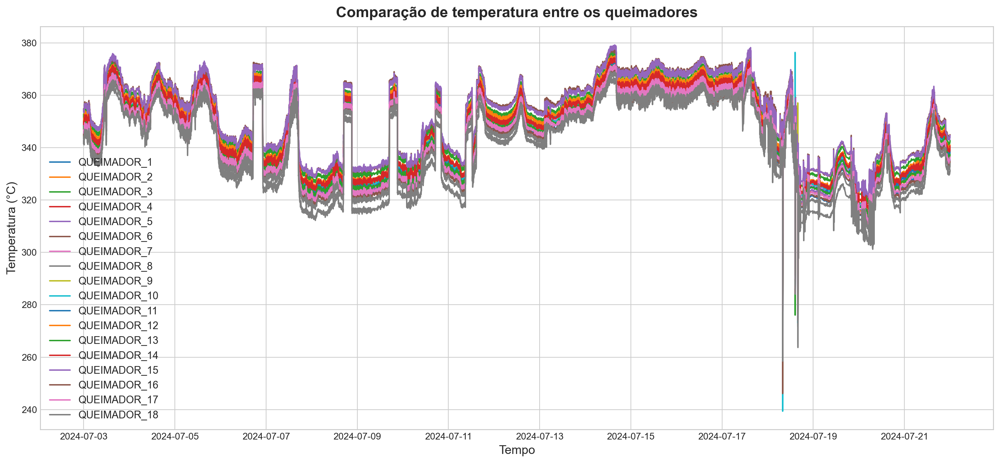

In [25]:
plt.figure(figsize=(15, 7))
for i in range(1, 19):
    plt.plot(df_5seg['QUEIMADOR_'+str(i)])
plt.legend(['QUEIMADOR_'+str(i) for i in range(1, 19)], fontsize=11)
plt.title('Comparação de temperatura entre os queimadores')
plt.xlabel('Tempo', fontsize=13)
plt.ylabel('Temperatura (°C)', fontsize=13)
plt.show()

O queimador 9 foi o único cujo registro bate com a condição de parada da máquina

In [26]:
queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18']

df_difference = df_5seg[queimadores].mean(axis=1).to_frame(name='AVG_QUEIMADOR_MANUAL')
df_difference.index = df_5seg.index
for i in range(1, 19):
    df_difference['DIFF_Q'+str(i)+'_AVG_MANUAL'] = abs(df_difference['AVG_QUEIMADOR_MANUAL'] - df_5seg['QUEIMADOR_'+str(i)])

print('\033[93mQueimadores que registraram diferença com a média calculada máxima maior que 25°C ao longo do tempo:\033[0m')
for i in range(1, 19):
    if df_difference['DIFF_Q'+str(i)+'_AVG_MANUAL'].max() > 25:
        print(f'QUEIMADOR_{i}', end='  ')
df_difference.describe().T

Queimadores que registraram diferença com a média calculada máxima maior que 25°C ao longo do tempo:
QUEIMADOR_2  QUEIMADOR_3  QUEIMADOR_9  QUEIMADOR_10  QUEIMADOR_15  

,count,mean,std,min,25%,50%,75%,max
AVG_QUEIMADOR_MANUAL,328321.0,346.315010,15.252195,2.656034e+02,331.383698,349.509377,360.785621,372.581763
DIFF_Q1_AVG_MANUAL,328321.0,3.164223,0.244649,1.765357e-01,3.031111,3.176341,3.324392,6.698810
DIFF_Q2_AVG_MANUAL,328321.0,1.190906,0.342305,2.546111e-05,0.999193,1.183005,1.392468,27.994641
DIFF_Q3_AVG_MANUAL,328321.0,3.931849,0.724614,2.140123e+00,3.331560,3.871060,4.606856,35.505886
DIFF_Q4_AVG_MANUAL,328321.0,0.383070,0.210399,3.344445e-06,0.229887,0.379339,0.522754,10.362805
DIFF_Q5_AVG_MANUAL,328321.0,0.806292,0.392362,5.555478e-09,0.508406,0.764033,1.144036,6.755207
DIFF_Q6_AVG_MANUAL,328321.0,6.182410,0.492226,5.745053e-01,5.803014,6.246243,6.581209,20.589901
DIFF_Q7_AVG_MANUAL,328321.0,0.401151,0.218190,1.716667e-06,0.235852,0.415914,0.555928,14.441516
DIFF_Q8_AVG_MANUAL,328321.0,6.889320,1.677647,1.108281e+00,5.347587,6.720489,8.514448,13.717633
DIFF_Q9_AVG_MANUAL,328321.0,1.548490,0.384304,1.310046e-02,1.293981,1.517078,1.838548,55.303577


O período das principais diferenças de temperatura, de modo geral, bate com as datas das paradas

In [27]:
df_high = pd.DataFrame()
for i in range(1, 19):
    df_high['INDEX_Q'+str(i)+'_HIGH'] = df_difference['DIFF_Q'+str(i)+'_AVG_MANUAL'].nlargest(7).index
    df_high['DIFF_Q'+str(i)+'_HIGH'] = df_difference['DIFF_Q'+str(i)+'_AVG_MANUAL'].nlargest(7).values
print('\033[91mNo dia 18:\033[0m')
print('\033[93m1ª parada começando às 07:52:00\033[0m')
print('\033[93m2ª parada começando às 14:26:00\033[0m')
print('\033[93m3ª parada começando às 15:52:00\033[0m')
df_high.T

No dia 18:
1ª parada começando às 07:52:00
2ª parada começando às 14:26:00
3ª parada começando às 15:52:00


,0,1,2,3,4,5,6
INDEX_Q1_HIGH,2024-07-18 15:53:10,2024-07-18 14:28:10,2024-07-18 14:28:05,2024-07-18 15:53:05,2024-07-18 16:14:55,2024-07-18 14:28:00,2024-07-18 01:18:25
DIFF_Q1_HIGH,6.69881,6.144474,5.587677,4.49419,4.42878,4.410216,4.295661
INDEX_Q2_HIGH,2024-07-18 15:53:10,2024-07-18 15:53:05,2024-07-18 15:53:15,2024-07-18 07:55:55,2024-07-18 15:53:00,2024-07-18 07:55:50,2024-07-18 07:56:00
DIFF_Q2_HIGH,27.994641,22.092999,18.085682,13.521794,12.535589,10.615668,9.505464
INDEX_Q3_HIGH,2024-07-18 07:55:55,2024-07-18 07:55:50,2024-07-18 07:56:00,2024-07-18 07:56:05,2024-07-18 15:53:10,2024-07-18 07:55:45,2024-07-18 15:53:15
DIFF_Q3_HIGH,35.505886,28.353509,27.101317,18.696771,17.692829,17.528291,14.755688
INDEX_Q4_HIGH,2024-07-18 15:53:10,2024-07-18 07:55:55,2024-07-18 07:56:00,2024-07-18 15:53:05,2024-07-18 07:55:50,2024-07-18 07:56:05,2024-07-18 14:28:25
DIFF_Q4_HIGH,10.362805,10.227047,8.216063,7.987194,7.839745,6.205102,5.785851
INDEX_Q5_HIGH,2024-07-18 15:53:10,2024-07-18 15:53:05,2024-07-18 14:28:10,2024-07-18 14:28:05,2024-07-18 14:28:15,2024-07-18 15:53:15,2024-07-18 08:04:25
DIFF_Q5_HIGH,6.755207,5.035663,4.487949,3.840302,3.702742,3.61784,2.997655


Diferença entre o queimador com menor e maior temperatura a cada instante.  

Os picos de diferença refletem as paradas da máquina.

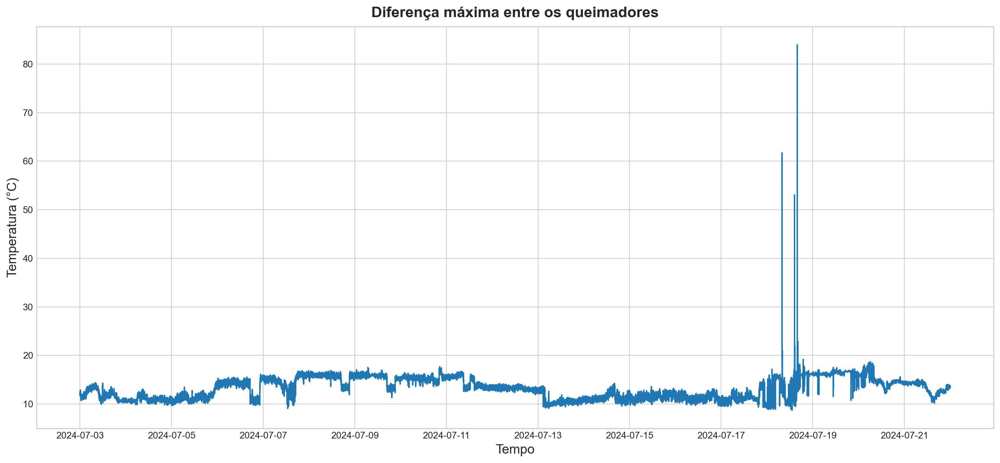

In [28]:
min_values = df_5seg[queimadores].min(axis=1)
max_values = df_5seg[queimadores].max(axis=1)
diff = max_values - min_values

# plot 
plt.figure(figsize=(15, 7))
plt.plot(diff, label='Diferença')
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Temperatura (°C)', fontsize=14)
plt.title('Diferença máxima entre os queimadores')
plt.show()


No período de 03/07 (09h - 14h), houve um aumento contínuo programado do FATOR_DE_CARGA

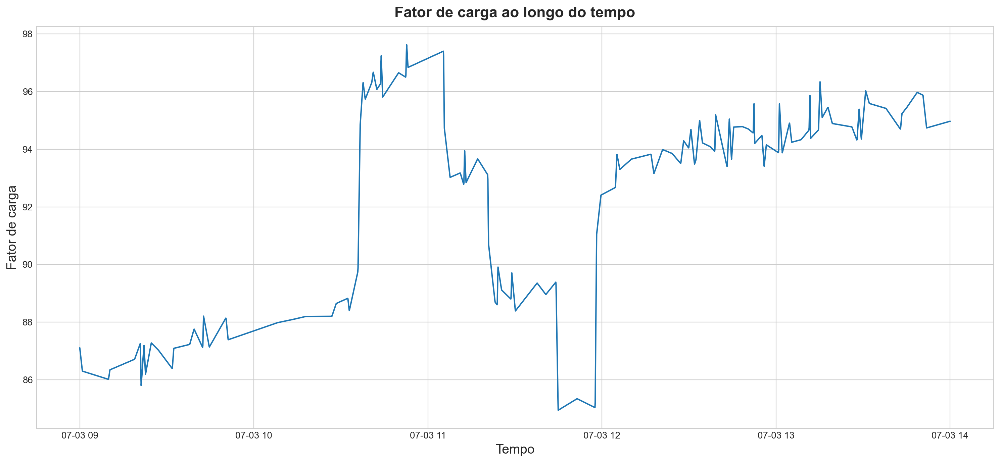

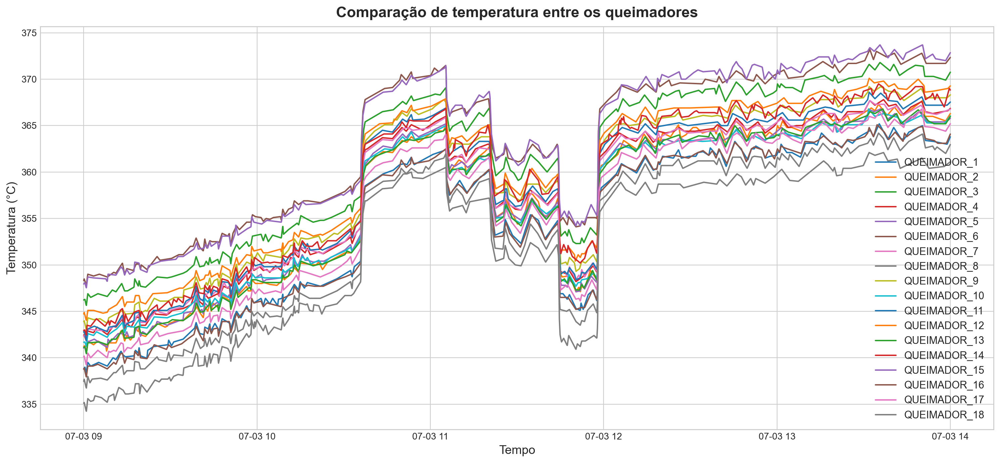

In [29]:
start_time = '2024-07-03 09:00:00'
end_time = '2024-07-03 14:00:00'

plt.figure(figsize=(15, 7))
plt.plot(df_5seg.loc[start_time:end_time]['FATOR_DE_CARGA'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Fator de carga', fontsize=14)
plt.title('Fator de carga ao longo do tempo')
plt.show()

plt.figure(figsize=(15, 7))
for i in range(1, 19):
    plt.plot(df_5seg.loc[start_time:end_time]['QUEIMADOR_'+str(i)])
plt.legend(['QUEIMADOR_'+str(i) for i in range(1, 19)], fontsize=11)
plt.title('Comparação de temperatura entre os queimadores')
plt.xlabel('Tempo', fontsize=13)
plt.ylabel('Temperatura (°C)', fontsize=13)
plt.show()

# Preparação dos Dados

Features a serem reduzidas/cortadas

In [8]:
df.columns

Index(['POTENCIA_ATIVA_GERADOR', 'TEMPERATURA_EXAUSTAO_T7', 'TEMEPERATURA_ATM',
       'TEMPERATURA_DO_GAS_COMBUSTIVEL', 'VAZAO_DE_GAS_COMBUSTIVEL',
       'H2_CROMATOGRAFO', 'ANALISADOR_DE_H2', 'H2_NORM', 'CO_NORM',
       'METANO_NORM', 'CO2_NORM', 'ETILENO_NORM', 'ETANO_NORM', 'PROPANO_NORM',
       'PROPILENO_NORM', 'C5+_NORM', 'N-BUTANO_NORM', 'ENXOFRE_NORM',
       'PODER_CALORIFICO_BRUTO_EM_MASSA', 'PODER_CALORIFICO_LIQUIDO_EM_MASSA',
       'PODER_CALORIFICO_BRUTO_EM_VOLUME',
       'PODER_CALORIFICO_LIQUIDO_EM_VOLUME', 'FATOR_DE_SOMA', 'PESO_MOLECULAR',
       'DENSIDADE', 'DENSIDADE_RELATIVA', 'INDICE_WOBBE_BRUTO',
       'INDICE_WOBBE_LIQUIDO', 'QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3',
       'QUEIMADOR_4', 'QUEIMADOR_5', 'QUEIMADOR_6', 'QUEIMADOR_7',
       'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10', 'QUEIMADOR_11',
       'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
       'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'FATOR_DE_CARGA',
       'TEM

## Potência da Máquina

Considerando que o que o modelo está se prontificando a decidir é o valor da Potência Ativa, de modo a impedir as paradas, talvez considerar variáveis de comportamento igual à esta ação não faça muito sentido, uma vez que estas são mera consequência da ação do agente

## Gases

Dado o relacionamento dos demais gases com o H2 e o Metano e suas importâncias, podemos reduzir esta parte do dataset a apenas eles dois

In [9]:
df_gases = df[['H2_NORM', 'METANO_NORM']]

## Propriedades do Gás

Com base na matriz de correlação, as propriedades, de modo geral, possuem um comportamento semelhante do qual podemos reduzir através do PCA

Text(0, 0.5, 'cumulative explained variance')

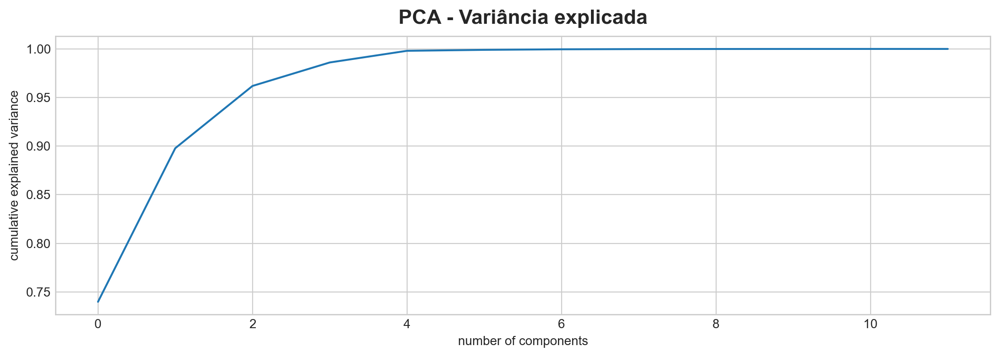

In [10]:
propriedades = ['VAZAO_DE_GAS_COMBUSTIVEL','PODER_CALORIFICO_BRUTO_EM_MASSA',
                'PODER_CALORIFICO_LIQUIDO_EM_MASSA','PODER_CALORIFICO_BRUTO_EM_VOLUME',
                'PODER_CALORIFICO_LIQUIDO_EM_VOLUME','FATOR_DE_SOMA','PESO_MOLECULAR',
                'DENSIDADE','DENSIDADE_RELATIVA','INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO',
                'TEMPERATURA_MEDIA_DO_QUEIMADOR']

scaler = StandardScaler()
data_std = scaler.fit_transform(df[propriedades].values)
PCA_solver = PCA()
PCA_solver.fit_transform(data_std)

plt.plot(np.cumsum(PCA_solver.explained_variance_ratio_))
plt.title('PCA - Variância explicada')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

# 'TEMEPERATURA_ATM','TEMPERATURA_DO_GAS_COMBUSTIVEL'

In [11]:
np.cumsum(PCA_solver.explained_variance_ratio_)

array([0.73978868, 0.89783289, 0.96191561, 0.98607334, 0.99806598,
       0.99905578, 0.9996196 , 0.9998495 , 0.99993152, 0.9999812 ,
       0.99999709, 1.        ])

A partir do número de componentes igual 4, a perda de informação dos dados pelo PCA é pouca

In [12]:
PCA_solver_prop = PCA(n_components=4)

df_prop = pd.DataFrame(PCA_solver_prop.fit_transform(data_std), columns=[f'C{i}' for i in range(1, 5)])
df_prop.index = df.index
df_prop.columns = ['PCA_PROP1','PCA_PROP2','PCA_PROP3','PCA_PROP4']

components = PCA_solver_prop.components_
explained_variance_ratio = PCA_solver_prop.explained_variance_ratio_

print('\n\033[93mVariância explicada por cada componente\033[0m')
pd.DataFrame(PCA_solver_prop.components_, columns=propriedades).T


Variância explicada por cada componente


,0,1,2,3
VAZAO_DE_GAS_COMBUSTIVEL,-0.261576,-0.265349,-0.154941,0.907875
PODER_CALORIFICO_BRUTO_EM_MASSA,-0.228846,0.518517,0.109199,0.122741
PODER_CALORIFICO_LIQUIDO_EM_MASSA,-0.217876,0.540676,0.093853,0.135791
PODER_CALORIFICO_BRUTO_EM_VOLUME,0.327255,-0.031500,-0.238626,0.048093
PODER_CALORIFICO_LIQUIDO_EM_VOLUME,0.327327,-0.033226,-0.236825,0.046161
FATOR_DE_SOMA,-0.309042,-0.003163,-0.419906,-0.170077
PESO_MOLECULAR,0.323302,-0.135167,-0.199065,-0.001984
DENSIDADE,0.303191,-0.027839,0.474665,0.166679
DENSIDADE_RELATIVA,0.303269,-0.025757,0.474492,0.166973
INDICE_WOBBE_BRUTO,0.299814,0.248557,-0.293841,0.155126


Variáveis mais relevantes para cada componente

In [13]:
n_pcs = PCA_solver_prop.n_components_
most_important = [np.abs(PCA_solver_prop.components_[i]).argmax() for i in range(n_pcs)]
initial_feature_names = propriedades
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
for i in range(4):
    print(f"Component {i}: {most_important_names[i]}")

Component 0: PODER_CALORIFICO_LIQUIDO_EM_VOLUME
Component 1: PODER_CALORIFICO_LIQUIDO_EM_MASSA
Component 2: DENSIDADE
Component 3: VAZAO_DE_GAS_COMBUSTIVEL


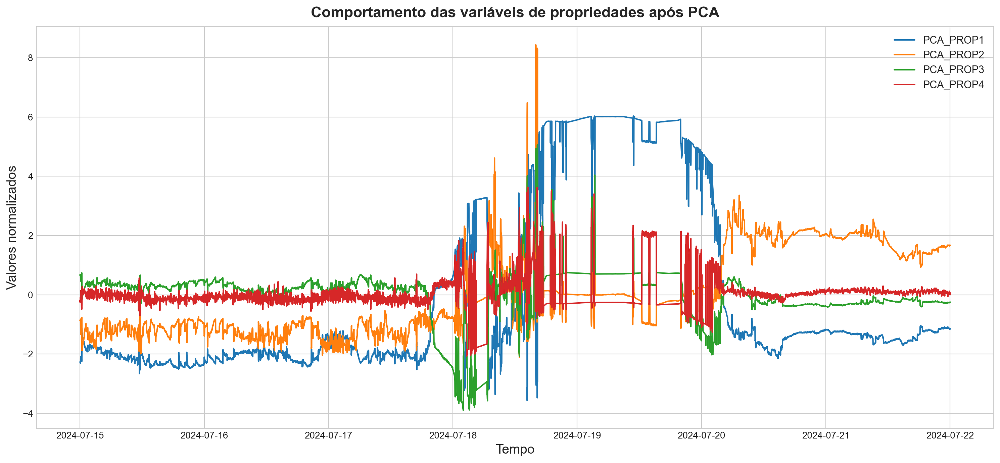

In [26]:
plt.figure(figsize=(15, 7))
for i in df_prop.columns:
    plt.plot(df_prop[i])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Valores normalizados', fontsize=14)
plt.title('Comportamento das variáveis de propriedades após PCA')
plt.legend(df_prop.columns, fontsize=11)
plt.show()

## Queimadores

Há algumas maneiras de reduzir a informação dos 18 queimadores. Como queremos obter a informação do agravante diferença de temperatura em relação à média:
- pegar apenas a diferença máxima a cada instante, independente de quem seja o queimador;
- pegar os queimadores que mais apresentaram o comportamento inadequado.

Optamos pela primeira opção.

In [15]:
df_difference = pd.DataFrame()
df_difference.index = df_saida.index
for i in range(1, 19):
    df_difference['DIFF_Q'+str(i)+'_AVG_GIVEN'] = abs(df['TEMPERATURA_MEDIA_DO_QUEIMADOR'] - df['QUEIMADOR_'+str(i)])
    
df_quei = df_difference[df_difference.columns[1:]].max(axis=1)
df_quei = df_quei.to_frame(name='MAX_QDIFF')

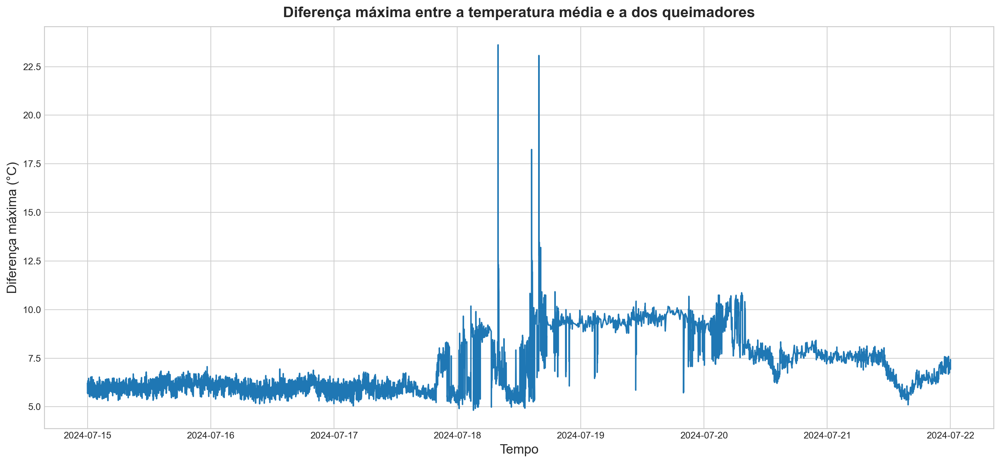

In [16]:
plt.figure(figsize=(15, 7))
plt.plot(df_quei)
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Diferença máxima (°C)', fontsize=14)
plt.title('Diferença máxima entre a temperatura média e a dos queimadores')
plt.show()

## Temperatura ATM X Temperatura do Gás

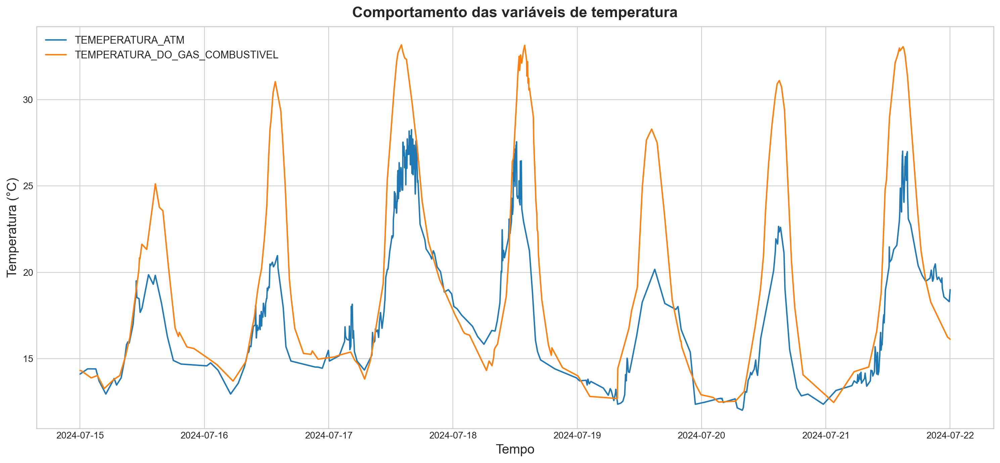

In [17]:
temp_atm = ['TEMEPERATURA_ATM','TEMPERATURA_DO_GAS_COMBUSTIVEL']

plt.figure(figsize=(15, 7))
for i in temp_atm:
    plt.plot(df[i])
plt.legend(temp_atm, fontsize=11)
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Temperatura (°C)', fontsize=14)
plt.title('Comportamento das variáveis de temperatura')
plt.show()

In [18]:

scaler = StandardScaler()
data_std = scaler.fit_transform(df[temp_atm].values)

PCA_solver_temp_atm = PCA(n_components=1)
df_temp_atm = pd.DataFrame(PCA_solver_temp_atm.fit_transform(data_std), columns=['PCA_TEMP_ATM'])
df_temp_atm.index = df.index

components = PCA_solver_temp_atm.components_
explained_variance_ratio = PCA_solver_temp_atm.explained_variance_ratio_

print('\n\033[93mVariância explicada por cada componente\033[0m')
pd.DataFrame(PCA_solver_temp_atm.components_, columns=temp_atm).T


Variância explicada por cada componente


,0
TEMEPERATURA_ATM,0.707107
TEMPERATURA_DO_GAS_COMBUSTIVEL,0.707107


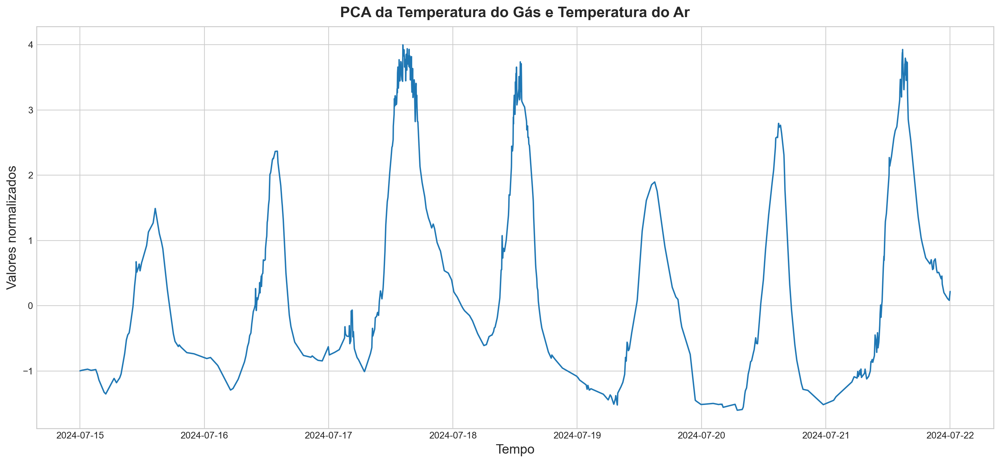

In [21]:
plt.figure(figsize=(15, 7))
plt.plot(df_temp_atm['PCA_TEMP_ATM'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Valores normalizados', fontsize=14)
plt.title('PCA da Temperatura do Gás e Temperatura do Ar')
plt.show()

## Concatenação do Dataset de Estados Final

In [24]:
df_final = pd.concat([df_gases, df_prop, df_temp_atm, df_quei], axis=1)
print('Número de variáveis pré-redução: ',np.shape(df))
print('Número de variáveis pós-redução: ', np.shape(df_final))
print(df_final.columns)

Número de variáveis pré-redução:  (10081, 49)
Número de variáveis pós-redução:  (10081, 8)
Index(['H2_NORM', 'METANO_NORM', 'PCA_PROP1', 'PCA_PROP2', 'PCA_PROP3',
       'PCA_PROP4', 'PCA_TEMP_ATM', 'MAX_QDIFF'],
      dtype='object')


# Função de Recompensa

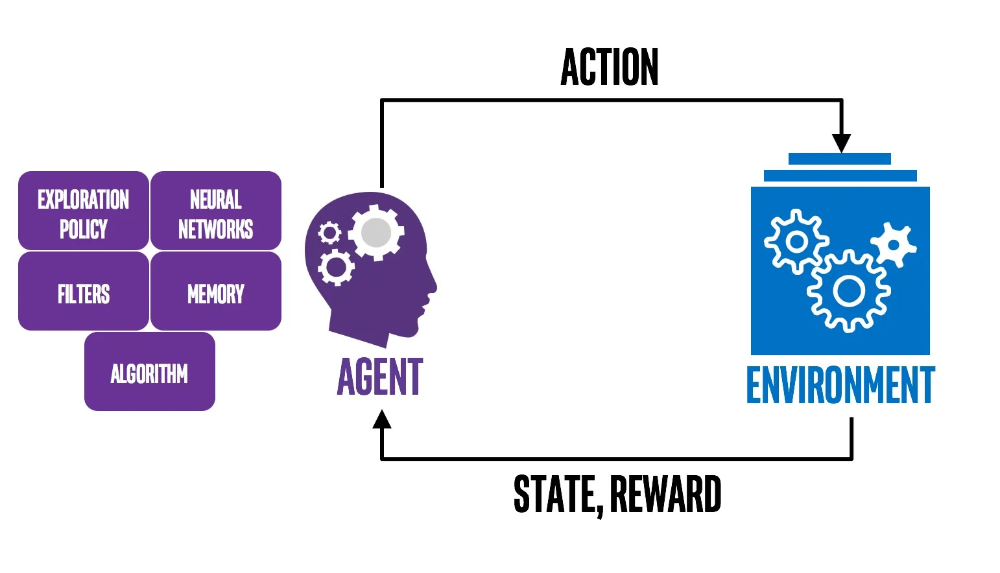

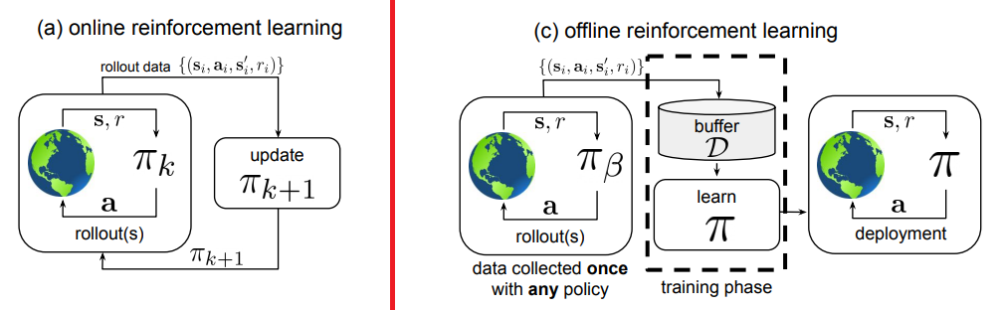

In [47]:
from IPython.display import Image
display(Image(filename='interacao.jpg', width=800, height=800))
display(Image(filename='img1.png'))

Uma função polinomial que considere cada termo um aspecto diferente dos dados que sirva de parâmetro para o agente entender se o desempenho dele está bom

$$
    R(\textbf{x}) = PA(x_0) + MQ(x_4)
$$

Funções polinomiais:
- $PA(x_0)$: $\qquad$ 'POTENCIA_ATIVA_GERADOR' 
- $MQ(x_4)$: $\qquad$ 'MAX_QDIFF'

In [48]:
df_reward = pd.DataFrame(index=df_final.index)

## $PA$

$$
PA(x) = \begin{cases}
    2 \cdot \left(1 - \frac{(x - 21)^2}{4^2}\right) & \text{se } 16.5 \leq x \leq 23 \\
    -2 & \text{caso contrário}
\end{cases} 
$$

### Distribuição dos valores

C:\Users\Gustavo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


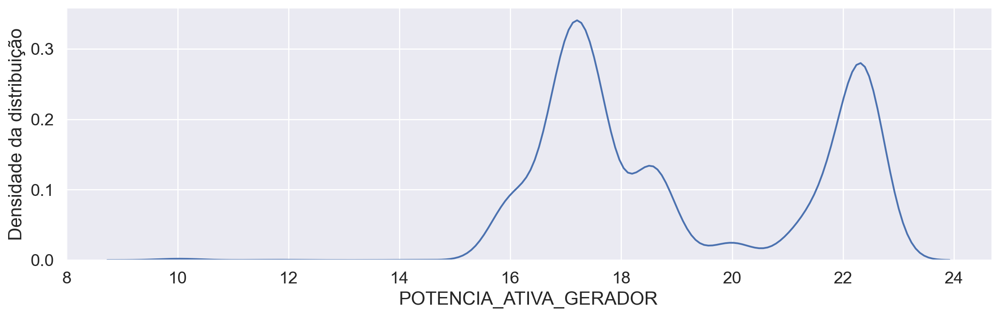

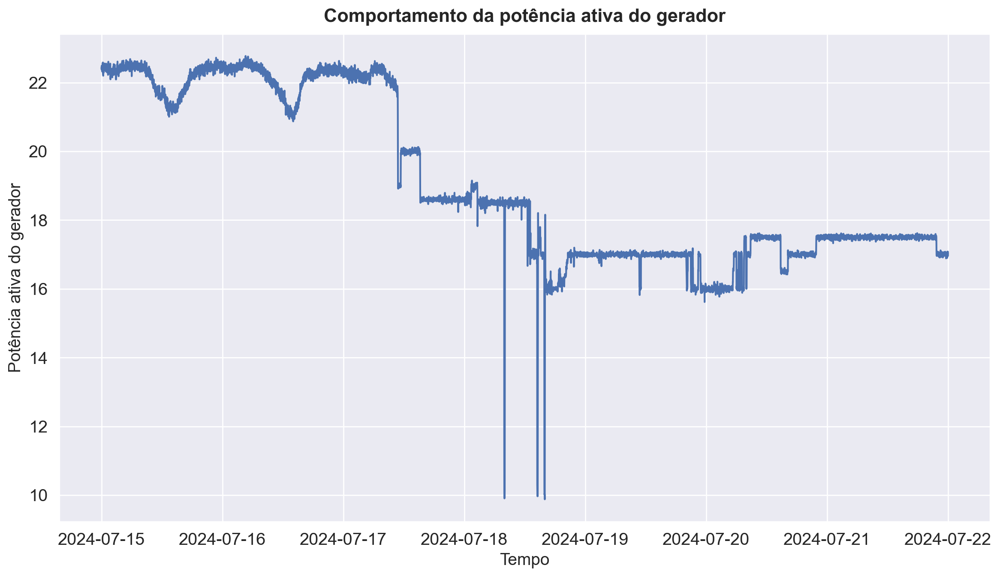

In [49]:
sns.set_theme(font_scale = 1.3)
sns.displot(
    df['POTENCIA_ATIVA_GERADOR'],
    height=4,
    aspect=3,
    kind='kde'
)
plt.ylabel('Densidade da distribuição')
plt.show()

plt.figure(figsize=(12, 7))
plt.plot(df['POTENCIA_ATIVA_GERADOR'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Potência ativa do gerador', fontsize=14)
plt.title('Comportamento da potência ativa do gerador')
plt.show()

### Comportamento da função

In [50]:
def PA(x):
    y_opt = 21;    d = 4;    c = 3
    x = x.apply(lambda y: c * (1 - ((y-y_opt)/d)**2) if 16.5 <= y and y <= 23 else -c)
    return x

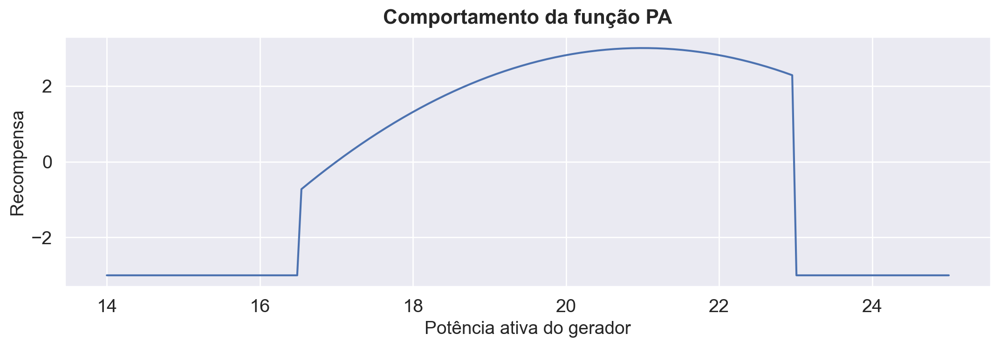

In [51]:
i = np.linspace(14, 25, 200)
plt.plot(i, PA(pd.Series(i)))
plt.xlabel('Potência ativa do gerador', fontsize=14)
plt.ylabel('Recompensa', fontsize=14)
plt.title('Comportamento da função PA')
plt.show()

### Aplicação

In [52]:
df_reward['PA'] = PA(df['POTENCIA_ATIVA_GERADOR'])

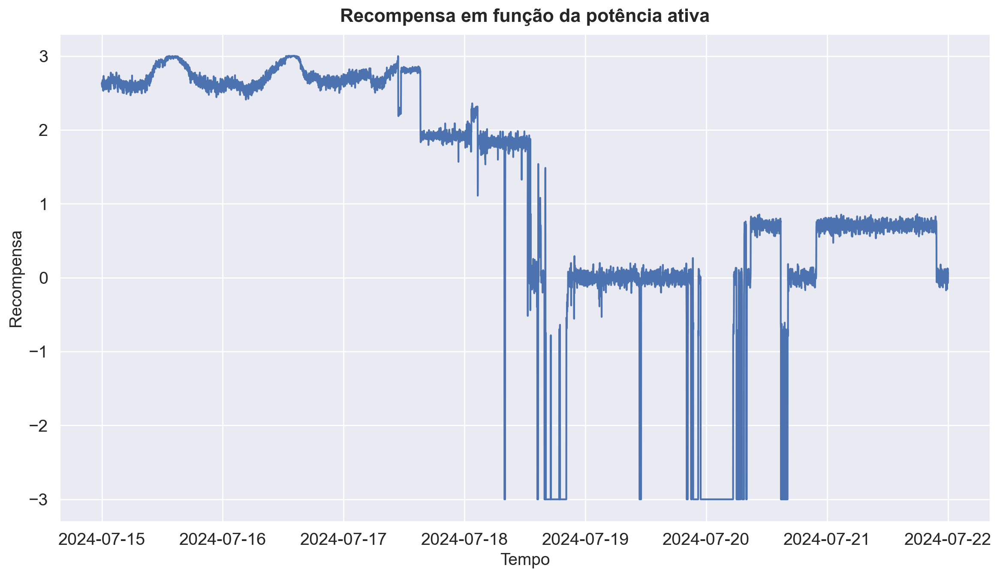

In [53]:
plt.figure(figsize=(12, 7))
plt.plot(df_reward['PA'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Recompensa', fontsize=14)
plt.title('Recompensa em função da potência ativa')
plt.show()

## $MQ$

$$
MQ(x) = \begin{cases}
    2 \cdot \left(2 - log_2(x+1) \right) & \text{se } x \leq 12 \\
    -8 & \text{caso contrário}
\end{cases} 
$$

### Distribuição dos valores

C:\Users\Gustavo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


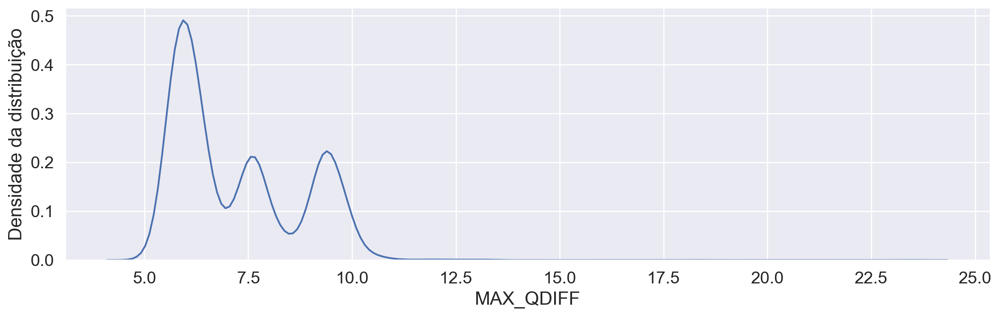

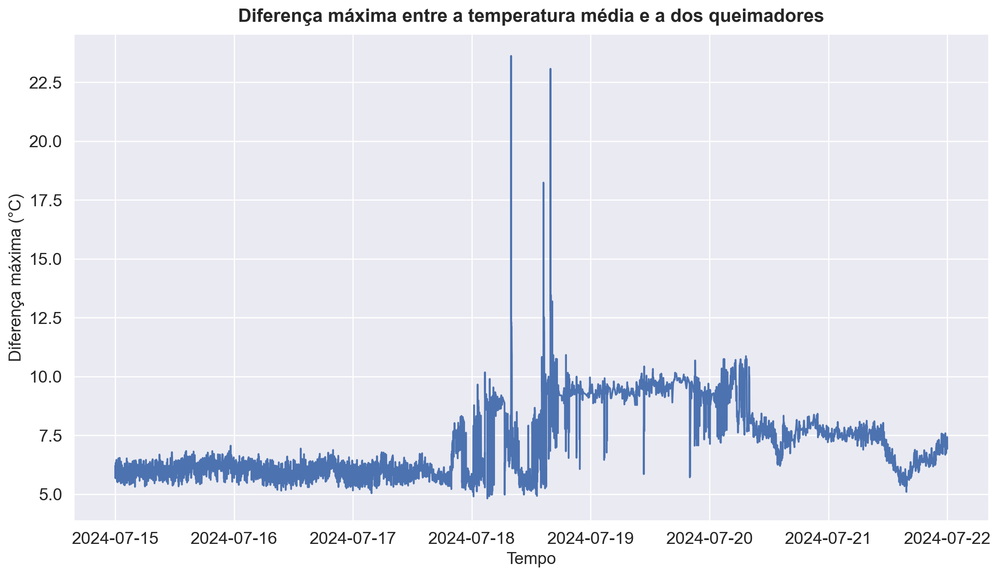

In [54]:
sns.set_theme(font_scale = 1.3)
sns.displot(
    df_final['MAX_QDIFF'], # Dados a serem representados
    height=4, # Altura em polegadas do gráfico
    aspect=3, # Proporção entre largura e altura do gráfico. Números > 1 representam retâgulos mais 'deitados'
    kind='kde' # Distribuição contínua,
)
plt.ylabel('Densidade da distribuição')
plt.show()

plt.figure(figsize=(12, 7))
plt.plot(df_final['MAX_QDIFF'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Diferença máxima (°C)', fontsize=14)
plt.title('Diferença máxima entre a temperatura média e a dos queimadores')
plt.show()

### Comportamento da função

In [55]:
def MQ(x):
    c = 2
    x = x.apply(lambda y: c * (2 - np.log2(y+1)) if y <= 12 else -8)
    return x

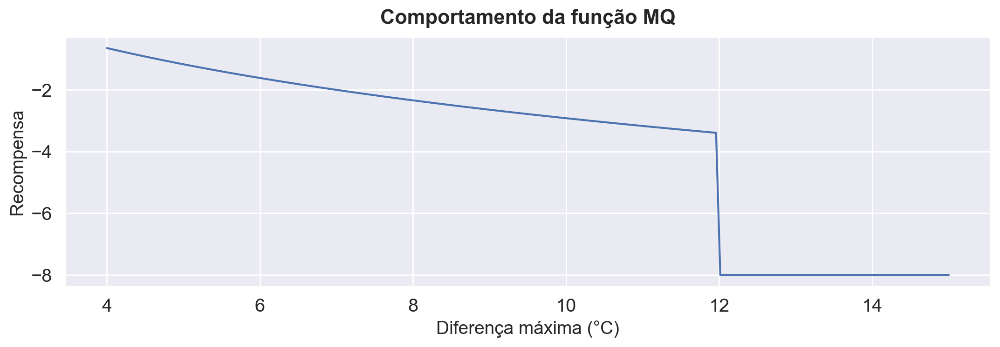

In [56]:
i = np.linspace(4, 15, 200)
plt.plot(i, MQ(pd.Series(i)))
plt.xlabel('Diferença máxima (°C)', fontsize=14)
plt.ylabel('Recompensa', fontsize=14)
plt.title('Comportamento da função MQ')
plt.show()

### Aplicação

In [57]:
df_reward['MQ'] = MQ(df_final['MAX_QDIFF'])

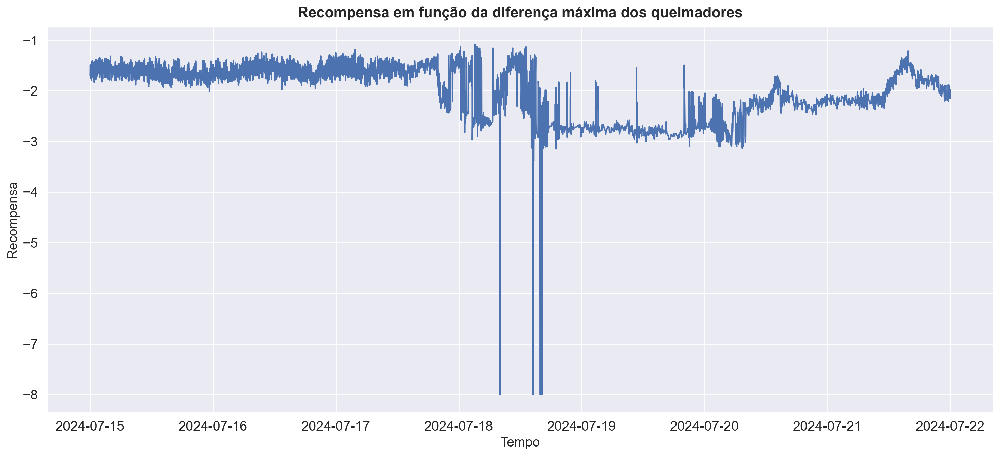

In [58]:
plt.figure(figsize=(15, 7))
plt.plot(df_reward['MQ'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Recompensa', fontsize=14)
plt.title('Recompensa em função da diferença máxima dos queimadores')
plt.show()

## $R$

In [59]:
reward = df_reward['PA'] + df_reward['MQ']

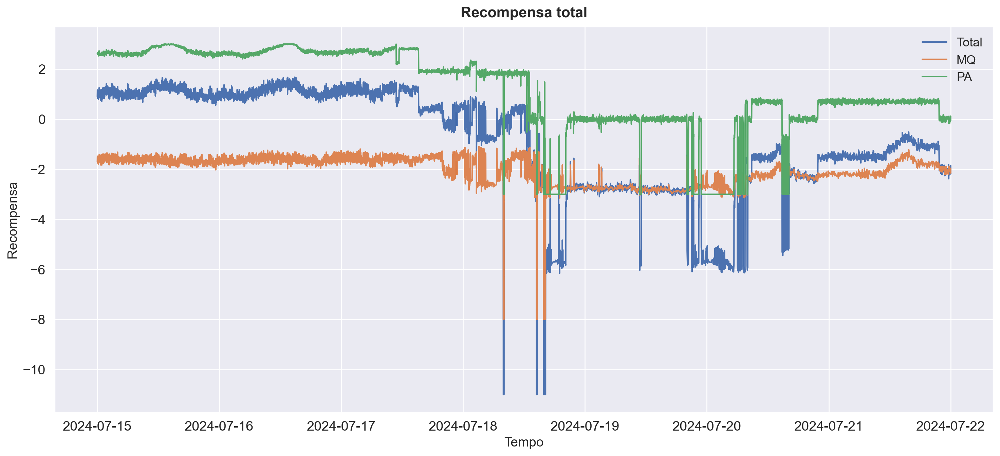

In [60]:
plt.figure(figsize=(15, 7))
plt.plot(reward)
plt.plot(df_reward['MQ'])
plt.plot(df_reward['PA'])
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Recompensa', fontsize=14)
plt.title('Recompensa total')
plt.legend(['Total', 'MQ', 'PA'], fontsize=13)
plt.show()

In [61]:
df_action = pd.DataFrame(index=df_final.index)
df_action['POTENCIA_ATIVA_GERADOR'] = df['POTENCIA_ATIVA_GERADOR']

df_final.to_csv('DF_FINAL.csv')
df_action.to_csv('DF_ACTION.csv')
reward.to_csv('DF_REWARD.csv')
df_reward.to_csv('DF_REWARD_DETAIL.csv')